
# Domain Name - Environment

# Dataset - AirQualityUCI

# Business Objective 
The dataset contains 9358 instances of hourly averaged responses from an array of 5 metal oxide chemical sensors embedded in an Air Quality Chemical Multisensor Device. The objective is to predict the Relative Humidity at a given point of time based on all other attributes affecting the change in RH.

### Table of Contents

1. [Dataset Description](#titanic)
2. [Importing the packages and dataset](#packages)
3. [Exploring the dataset](#explore)
4. [Feature Engineering](#fe)
5. [Linear Regression](#lr)
     - 5.1 [Create Features And Label](#tdt)
     - 5.2 [Split Train And Test Data](#pdt)
     - 5.3 [Create Instance Of the Model](#edt)
     - 5.4 [Fit Model](#ptdt)     
     - 5.5 [Predict Using Trained Model](#edt)
     - 5.6 [Evaluate Model Performance](#ptdt)
     
6. [Lasso Regression](#ls)
7. [Decision Tree](#dt)
     - 7.1 [Training Decision Tree Model](#tdt)
     - 7.2 [Predictions from Decision Tree Model](#pdt)
     - 7.3 [Evaluating the Decision Tree Model](#edt)
     - 7.4 [Parameter Tuning](#ptdt)
8. [Random Forest](#rf)
     - 8.1 [Training Random Forest Model](#trf)
     - 8.2 [Predictions from Random Forest Model](#prf)
     - 8.3 [Evaluating the Random Forest Model](#erf)
9. [Support Vector Regressor](#rf)
10. [KNN Regressor](#rf)
11. [Hyper Parameter Optimization with GridSearchCV and RandomizedSearchCV](#rf)

### 1. Description of Dataset

The airquality dataset contains data from March 2004 to February 2005 (one year) representing the longest freely available recordings of on field deployed air quality chemical sensor devices responses.

Missing values are tagged with -200 value.
Below are the attributes of the dataset,

0.	 Date (DD/MM/YYYY) 
1.	Time (HH.MM.SS)
2.	True hourly averaged concentration CO in mg/m^3 (reference analyzer)
3.	PT08.S1 (tin oxide) hourly averaged sensor response (nominally CO targeted)
4.	True hourly averaged overall Non Metanic Hydrocarbon concentration in microg/m^3 (reference analyzer)
5.	True hourly averaged Benzene concentration in microg/m^3 (reference analyzer) 
6.	PT08.S2 (Titania) hourly averaged sensor response (nominally NMHC targeted) 
7.	True hourly averaged NOx concentration in ppb (reference analyzer) 
8.	PT08.S3 (tungsten oxide) hourly averaged sensor response (nominally NOx targeted) 
9.	True hourly averaged NO2 concentration in microg/m^3 (reference analyzer) 
10.	PT08.S4 (tungsten oxide) hourly averaged sensor response (nominally NO2 targeted) 
11.	 PT08.S5 (indium oxide) hourly averaged sensor response (nominally O3 targeted) 
12.	 Temperature in °C 
13.	 Relative Humidity (%) 
14.	 AH Absolute Humidity

### 2. Importing the packages and dataset  <a id='packages'>

###### SHAP (SHapley Additive exPlanations) is a unified approach to explain the output of any machine learning model
###### ELI5 is a Python package which helps to debug machine learning classifiers and explain their predictions. 
###### LIME is a great tool explaining what machine learning classifiers are doing

In [1]:
!pip -q install plotly-express
!pip -q install shap
!pip -q install eli5
!pip -q install lime

In [2]:
#import the libraries requires for project
import numpy as np
import pandas as pd
import plotly.express as px
import pickle
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import os
os.getcwd()

'C:\\Users\\Siddhesh'

In [3]:
# Code for displaying plotly express plot
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))
  
import plotly_express as px

In [4]:
# print multiple statement in same line
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity ="all"

In [5]:
#from google.colab import files
#uploaded = files.upload()

ModuleNotFoundError: No module named 'google'

In [6]:
# Importing the datasets

df_airQ = pd.read_excel("AirQuality.xlsx")

In [7]:
import pandas_profiling
import collections
import warnings
warnings.filterwarnings('ignore')

In [8]:
eda_analysis = pandas_profiling.ProfileReport(df_airQ)
eda_analysis.to_file("ML_AirQuality_analysis.html")

In [ ]:
from IPython.display import display,HTML,IFrame

display(HTML(open('ML_AirQuality_analysis.html').read()))

### 3. Exploring the dataset  <a id='explore'>

In [9]:
df_airQ.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10,18:00:00,2.6,1360,150,11.9,1046,166,1056,113,1692,1268,13.6,48.9,0.7578
1,2004-03-10,19:00:00,2.0,1292,112,9.4,955,103,1174,92,1559,972,13.3,47.7,0.7255
2,2004-03-10,20:00:00,2.2,1402,88,9.0,939,131,1140,114,1555,1074,11.9,54.0,0.7502
3,2004-03-10,21:00:00,2.2,1376,80,9.2,948,172,1092,122,1584,1203,11.0,60.0,0.7867
4,2004-03-10,22:00:00,1.6,1272,51,6.5,836,131,1205,116,1490,1110,11.2,59.6,0.7888


In [10]:
df_airQ.tail()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
9352,2005-04-04,10:00:00,3.1,1314,-200,13.5,1101,472,539,190,1374,1729,21.9,29.3,0.7568
9353,2005-04-04,11:00:00,2.4,1163,-200,11.4,1027,353,604,179,1264,1269,24.3,23.7,0.7119
9354,2005-04-04,12:00:00,2.4,1142,-200,12.4,1063,293,603,175,1241,1092,26.9,18.3,0.6406
9355,2005-04-04,13:00:00,2.1,1003,-200,9.5,961,235,702,156,1041,770,28.3,13.5,0.5139
9356,2005-04-04,14:00:00,2.2,1071,-200,11.9,1047,265,654,168,1129,816,28.5,13.1,0.5028


In [11]:
df_airQ.shape

(9357, 15)

In [12]:
df_airQ.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9357 entries, 0 to 9356
Data columns (total 15 columns):
Date             9357 non-null datetime64[ns]
Time             9357 non-null object
CO(GT)           9357 non-null float64
PT08.S1(CO)      9357 non-null int64
NMHC(GT)         9357 non-null int64
C6H6(GT)         9357 non-null float64
PT08.S2(NMHC)    9357 non-null int64
NOx(GT)          9357 non-null int64
PT08.S3(NOx)     9357 non-null int64
NO2(GT)          9357 non-null int64
PT08.S4(NO2)     9357 non-null int64
PT08.S5(O3)      9357 non-null int64
T                9357 non-null float64
RH               9357 non-null float64
AH               9357 non-null float64
dtypes: datetime64[ns](1), float64(5), int64(8), object(1)
memory usage: 1.1+ MB


In [13]:
df_airQ.describe()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
count,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000
mean,-34.207524,1048.990061,-159.090093,1.865683,894.595276,168.616971,794.990168,58.148873,1391.479641,975.072032,9.778305,39.485380,-6.837604
std,77.657170,329.832710,139.789093,41.380206,342.333252,257.433866,321.993552,126.940455,467.210125,456.938184,43.203623,51.216145,38.976670
min,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000
25%,0.600000,921.000000,-200.000000,4.000000,711.000000,50.000000,637.000000,53.000000,1185.000000,700.000000,10.900000,34.100000,0.692300
50%,1.500000,1053.000000,-200.000000,7.900000,895.000000,141.000000,794.000000,96.000000,1446.000000,942.000000,17.200000,48.600000,0.976800
75%,2.600000,1221.000000,-200.000000,13.600000,1105.000000,284.000000,960.000000,133.000000,1662.000000,1255.000000,24.100000,61.900000,1.296200
max,11.900000,2040.000000,1189.000000,63.700000,2214.000000,1479.000000,2683.000000,340.000000,2775.000000,2523.000000,44.600000,88.700000,2.231000


In [14]:
df_airQ.describe(include = 'all')

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
count,9357,9357,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000
unique,391,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,2004-09-07 00:00:00,03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,24,390,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
first,2004-03-10 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,2005-04-04 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,-34.207524,1048.990061,-159.090093,1.865683,894.595276,168.616971,794.990168,58.148873,1391.479641,975.072032,9.778305,39.485380,-6.837604
std,NaN,NaN,77.657170,329.832710,139.789093,41.380206,342.333252,257.433866,321.993552,126.940455,467.210125,456.938184,43.203623,51.216145,38.976670
min,NaN,NaN,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000
25%,NaN,NaN,0.600000,921.000000,-200.000000,4.000000,711.000000,50.000000,637.000000,53.000000,1185.000000,700.000000,10.900000,34.100000,0.692300


In [15]:
import seaborn as sns

In [16]:
# Importing the packages
import matplotlib.pyplot as plt
%matplotlib inline

<Figure size 864x432 with 0 Axes>

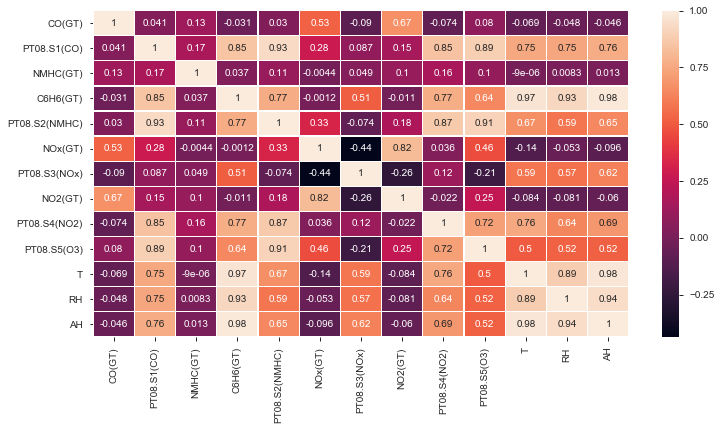

In [17]:
plt.figure(figsize=(12,6))
sns.heatmap(df_airQ.corr(), annot=True, linewidths=.3,)

From the correlation diagram we can see RH is positively correlated with PT08.S1(CO), C6H6(GT),  PT08.S2(NMHC), PT08.S3(NOx), PT08.S4(NO2), PT08.S5(O3), T and AH

### 4. Feature Engineering

In [18]:
df_airQ.dropna(how='all',inplace=True)

In [19]:
df_airQ.shape

(9357, 15)

In [21]:
#Convert Object type to String
df_airQ["Time"]=df_airQ["Time"].astype(str)

In [22]:
#Split hour from time into new column
df_airQ["Hour"]=df_airQ["Time"].apply(lambda x: int(x.split(':')[0]))

In [23]:
from datetime import datetime

In [24]:
print (df_airQ["Date"].dtype)

datetime64[ns]


In [25]:
df_airQ["Date"] = pd.to_datetime(df_airQ["Date"]) 
#print (df_air_O['Date'].dtype)

In [26]:
df_airQ.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9357 entries, 0 to 9356
Data columns (total 16 columns):
Date             9357 non-null datetime64[ns]
Time             9357 non-null object
CO(GT)           9357 non-null float64
PT08.S1(CO)      9357 non-null int64
NMHC(GT)         9357 non-null int64
C6H6(GT)         9357 non-null float64
PT08.S2(NMHC)    9357 non-null int64
NOx(GT)          9357 non-null int64
PT08.S3(NOx)     9357 non-null int64
NO2(GT)          9357 non-null int64
PT08.S4(NO2)     9357 non-null int64
PT08.S5(O3)      9357 non-null int64
T                9357 non-null float64
RH               9357 non-null float64
AH               9357 non-null float64
Hour             9357 non-null int64
dtypes: datetime64[ns](1), float64(5), int64(9), object(1)
memory usage: 1.2+ MB


In [27]:
df_airQ.shape

(9357, 16)

In [28]:
# Out of 9357, only 914 records have values, other 90% records have missing values (-200)
df_air_O = df_airQ.drop(["NMHC(GT)"],axis = 1)

In [29]:
df_air_O.shape

(9357, 15)

In [30]:
df_air_O.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9357 entries, 0 to 9356
Data columns (total 15 columns):
Date             9357 non-null datetime64[ns]
Time             9357 non-null object
CO(GT)           9357 non-null float64
PT08.S1(CO)      9357 non-null int64
C6H6(GT)         9357 non-null float64
PT08.S2(NMHC)    9357 non-null int64
NOx(GT)          9357 non-null int64
PT08.S3(NOx)     9357 non-null int64
NO2(GT)          9357 non-null int64
PT08.S4(NO2)     9357 non-null int64
PT08.S5(O3)      9357 non-null int64
T                9357 non-null float64
RH               9357 non-null float64
AH               9357 non-null float64
Hour             9357 non-null int64
dtypes: datetime64[ns](1), float64(5), int64(8), object(1)
memory usage: 1.1+ MB


In [31]:
#describe all values including NaN
df_air_O.describe(include = 'all')

,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Hour
count,9357,9357,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000
unique,391,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,2004-09-07 00:00:00,19:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,24,390,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
first,2004-03-10 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,2005-04-04 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,-34.207524,1048.990061,1.865683,894.595276,168.616971,794.990168,58.148873,1391.479641,975.072032,9.778305,39.485380,-6.837604,11.498557
std,NaN,NaN,77.657170,329.832710,41.380206,342.333252,257.433866,321.993552,126.940455,467.210125,456.938184,43.203623,51.216145,38.976670,6.923182
min,NaN,NaN,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,0.000000
25%,NaN,NaN,0.600000,921.000000,4.000000,711.000000,50.000000,637.000000,53.000000,1185.000000,700.000000,10.900000,34.100000,0.692300,5.000000


In [32]:
df_air_O = df_air_O.replace(-200,np.NaN)

In [33]:
df_air_O.shape

(9357, 15)

In [34]:
#NaN values in the below 3 columns were dropped
df_air_O=df_air_O.dropna(subset=["RH","AH","T"])  

In [35]:
df_air_O.shape

(8991, 15)

In [36]:
df_air_O.describe()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Hour
count,7344.000000,8991.000000,8991.000000,8991.000000,7396.000000,8991.000000,7393.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000
mean,2.129711,1099.833166,10.083105,939.153376,242.189292,835.493605,112.145137,1456.264598,1022.906128,18.317829,49.234201,1.025530,11.479591
std,1.436472,217.080037,7.449820,266.831429,206.312007,256.817320,47.629141,346.206794,398.484288,8.832116,17.316892,0.403813,6.913320
min,0.100000,647.000000,0.100000,383.000000,2.000000,322.000000,2.000000,551.000000,221.000000,-1.900000,9.200000,0.184700,0.000000
25%,1.100000,937.000000,4.400000,734.500000,97.000000,658.000000,77.000000,1227.000000,731.500000,11.800000,35.800000,0.736800,5.000000
50%,1.800000,1063.000000,8.200000,909.000000,178.000000,806.000000,109.000000,1463.000000,963.000000,17.800000,49.600000,0.995400,11.000000
75%,2.800000,1231.000000,14.000000,1116.000000,321.000000,969.500000,140.000000,1674.000000,1273.500000,24.400000,62.500000,1.313700,17.000000
max,11.900000,2040.000000,63.700000,2214.000000,1479.000000,2683.000000,333.000000,2775.000000,2523.000000,44.600000,88.700000,2.231000,23.000000


In [37]:
df_air_O.to_excel("AQ_OP.xlsx",sheet_name='Sheet_name_1')

In [38]:
#For extracting year,month and day to new column, the code as below:
df_air_O['Year'] = df_air_O['Date'].dt.year
df_air_O['Month'] = df_air_O['Date'].dt.month
df_air_O['Day'] = df_air_O['Date'].dt.day

In [39]:
df_air_O['Month_Str'] = df_air_O['Month'].map( {1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun', 7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'} ).astype(str)

In [40]:
df_air_O.shape

(8991, 19)

In [41]:
df_air_O.head()

,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Hour,Year,Month,Day,Month_Str
0,2004-03-10,18:00:00,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578,18,2004,3,10,Mar
1,2004-03-10,19:00:00,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255,19,2004,3,10,Mar
2,2004-03-10,20:00:00,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502,20,2004,3,10,Mar
3,2004-03-10,21:00:00,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867,21,2004,3,10,Mar
4,2004-03-10,22:00:00,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888,22,2004,3,10,Mar


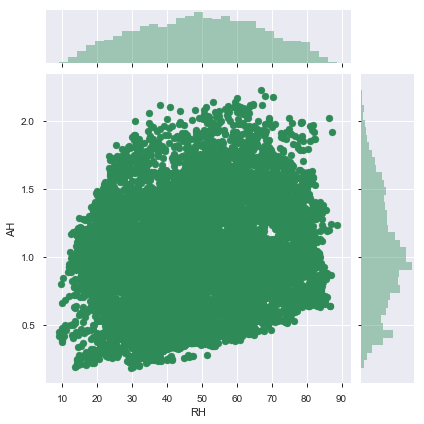

In [42]:
sns.jointplot('RH', 'AH', df_air_O, kind='scatter', color='seagreen')

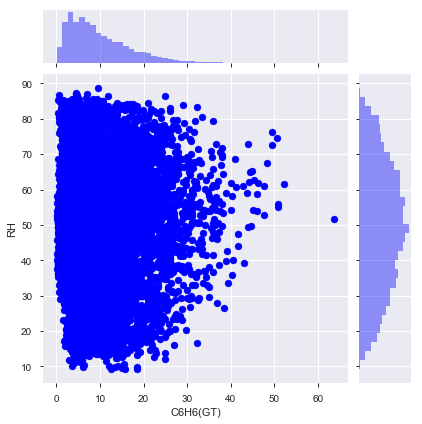

In [43]:
sns.jointplot('C6H6(GT)', 'RH', df_air_O, kind='scatter', color='blue')

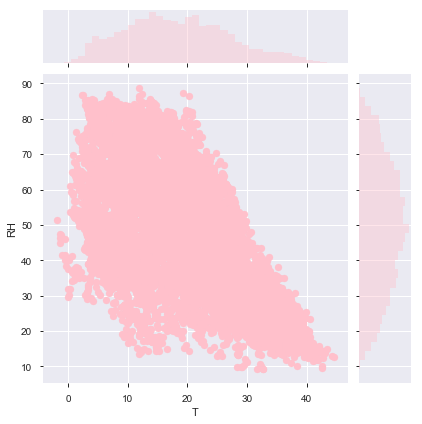

In [44]:
sns.jointplot('T', 'RH', df_air_O, kind='scatter', color='pink')

In [45]:
df_air_O.head()

,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Hour,Year,Month,Day,Month_Str
0,2004-03-10,18:00:00,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578,18,2004,3,10,Mar
1,2004-03-10,19:00:00,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255,19,2004,3,10,Mar
2,2004-03-10,20:00:00,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502,20,2004,3,10,Mar
3,2004-03-10,21:00:00,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867,21,2004,3,10,Mar
4,2004-03-10,22:00:00,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888,22,2004,3,10,Mar


In [46]:
df_air_O["CO(GT)"]=df_air_O["CO(GT)"].fillna(df_air_O.groupby(["Month","Hour"])["CO(GT)"].transform('mean'))

In [47]:
df_air_O["NOx(GT)"]=df_air_O["NOx(GT)"].fillna(df_air_O.groupby(["Hour","Month"])["NOx(GT)"].transform('mean'))

In [48]:
df_air_O["NO2(GT)"]=df_air_O["NO2(GT)"].fillna(df_air_O.groupby(['Hour','Month'])["NO2(GT)"].transform('mean'))

In [49]:
df_air_O.shape

(8991, 19)

In [50]:
df_air_O.head()

,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Hour,Year,Month,Day,Month_Str
0,2004-03-10,18:00:00,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578,18,2004,3,10,Mar
1,2004-03-10,19:00:00,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255,19,2004,3,10,Mar
2,2004-03-10,20:00:00,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502,20,2004,3,10,Mar
3,2004-03-10,21:00:00,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867,21,2004,3,10,Mar
4,2004-03-10,22:00:00,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888,22,2004,3,10,Mar


In [51]:
# column value replaced by  year, day and hourly mena value
df_air_O["CO(GT)"]=df_air_O["CO(GT)"].fillna(df_air_O.groupby(['Hour','Day','Year'])["CO(GT)"].transform('mean'))

In [52]:
df_air_O["NOx(GT)"]=df_air_O["NOx(GT)"].fillna(df_air_O.groupby(['Hour','Day','Year'])["NOx(GT)"].transform('mean'))

In [53]:
df_air_O["NO2(GT)"]=df_air_O["NO2(GT)"].fillna(df_air_O.groupby(['Hour','Day','Year'])["NO2(GT)"].transform('mean'))

In [54]:
#Find Null values if any
df_air_O.isnull().values.any()

False

In [55]:
df_air_O.isnull().sum()

Date             0
Time             0
CO(GT)           0
PT08.S1(CO)      0
C6H6(GT)         0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
PT08.S5(O3)      0
T                0
RH               0
AH               0
Hour             0
Year             0
Month            0
Day              0
Month_Str        0
dtype: int64

In [56]:
#unique values
df_air_O.nunique()

Date              383
Time               24
CO(GT)            359
PT08.S1(CO)      1041
C6H6(GT)          407
PT08.S2(NMHC)    1245
NOx(GT)          1082
PT08.S3(NOx)     1221
NO2(GT)           461
PT08.S4(NO2)     1603
PT08.S5(O3)      1743
T                 436
RH                753
AH               6683
Hour               24
Year                2
Month              12
Day                31
Month_Str          12
dtype: int64

In [57]:
df_air_O.to_excel("AQ_OP.xlsx",sheet_name='Sheet_name_1')

In [58]:
df_air_O.to_csv("AQ_OP.csv")

** Descriptive Statistics**

In [ ]:
#df_air_O[df_air_O['NOx(GT)']==-200].iloc[0:8991]

In [ ]:
#airQuality_df = df_air_O

In [59]:
print('Count of missing values:\n',df_air_O.shape[0]-df_air_O.count())

Count of missing values:
 Date             0
Time             0
CO(GT)           0
PT08.S1(CO)      0
C6H6(GT)         0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
PT08.S5(O3)      0
T                0
RH               0
AH               0
Hour             0
Year             0
Month            0
Day              0
Month_Str        0
dtype: int64


In [60]:
df_air_O.describe(include = 'all')

,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Hour,Year,Month,Day,Month_Str
count,8991,8991,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991
unique,383,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12
top,2005-03-06 00:00:00,09:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Mar
freq,24,378,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1253
first,2004-03-10 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,2005-04-04 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,2.087329,1099.833166,10.083105,939.153376,235.651393,835.493605,108.166775,1456.264598,1022.906128,18.317829,49.234201,1.025530,11.479591,2004.234568,6.327772,15.941386,NaN
std,NaN,NaN,1.378213,217.080037,7.449820,266.831429,196.904651,256.817320,45.549807,346.206794,398.484288,8.832116,17.316892,0.403813,6.913320,0.423752,3.407854,8.839013,NaN
min,NaN,NaN,0.100000,647.000000,0.100000,383.000000,2.000000,322.000000,2.000000,551.000000,221.000000,-1.900000,9.200000,0.184700,0.000000,2004.000000,1.000000,1.000000,NaN
25%,NaN,NaN,1.043505,937.000000,4.400000,734.500000,100.000000,658.000000,73.000000,1227.000000,731.500000,11.800000,35.800000,0.736800,5.000000,2004.000000,3.000000,8.000000,NaN


In [61]:
df_air_O = df_air_O.fillna(0)

In [62]:
df_air_O["CO(GT)"] = df_air_O["CO(GT)"].replace(0,df_air_O["CO(GT)"].median())

In [63]:
df_air_O["PT08.S1(CO)"] = df_air_O["PT08.S1(CO)"].replace(0,df_air_O["PT08.S1(CO)"].median())

In [64]:
df_air_O["C6H6(GT)"] = df_air_O["C6H6(GT)"].replace(0,df_air_O["C6H6(GT)"].median())

In [65]:
df_air_O["PT08.S2(NMHC)"] = df_air_O["PT08.S2(NMHC)"].replace(0,df_air_O["PT08.S2(NMHC)"].median())

In [66]:
df_air_O["PT08.S3(NOx)"] = df_air_O["PT08.S3(NOx)"].replace(0,df_air_O["PT08.S3(NOx)"].median())

In [67]:
df_air_O["NO2(GT)"] = df_air_O["NO2(GT)"].replace(0,df_air_O["NO2(GT)"].median())

In [68]:
df_air_O["PT08.S4(NO2)"] = df_air_O["PT08.S4(NO2)"].replace(0,df_air_O["PT08.S4(NO2)"].median())

In [69]:
df_air_O["PT08.S5(O3)"] = df_air_O["PT08.S5(O3)"].replace(0,df_air_O["PT08.S5(O3)"].median())

In [70]:
df_air_O["T"] = df_air_O["T"].replace(0,df_air_O["T"].median())

In [71]:
df_air_O["AH"] = df_air_O["AH"].replace(0,df_air_O["AH"].median())

In [72]:
df_air_O["RH"] = df_air_O["RH"].replace(0,df_air_O["RH"].median())

In [73]:
df_air_O["Month_Str"] = df_air_O["Month_Str"].astype(str)

In [74]:
df_air_O["Month"].isnull().sum()

0

In [75]:
df_air_O.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8991 entries, 0 to 9356
Data columns (total 19 columns):
Date             8991 non-null datetime64[ns]
Time             8991 non-null object
CO(GT)           8991 non-null float64
PT08.S1(CO)      8991 non-null float64
C6H6(GT)         8991 non-null float64
PT08.S2(NMHC)    8991 non-null float64
NOx(GT)          8991 non-null float64
PT08.S3(NOx)     8991 non-null float64
NO2(GT)          8991 non-null float64
PT08.S4(NO2)     8991 non-null float64
PT08.S5(O3)      8991 non-null float64
T                8991 non-null float64
RH               8991 non-null float64
AH               8991 non-null float64
Hour             8991 non-null int64
Year             8991 non-null int64
Month            8991 non-null int64
Day              8991 non-null int64
Month_Str        8991 non-null object
dtypes: datetime64[ns](1), float64(12), int64(4), object(2)
memory usage: 1.4+ MB


In [76]:
#to select all numerical variables
df_num = df_air_O.select_dtypes(include=['float64','int64'])
#PT08.S1(CO), C6H6(GT), PT08.S2(NMHC), PT08.S3(NOx), PT08.S4(NO2), PT08.S5(O3), T and AH
#df_num = df_air_O[['PT08.S1(CO)','C6H6(GT)','PT08.S2(NMHC)','PT08.S3(NOx)','PT08.S4(NO2)','PT08.S5(O3)','RH','AH','T','Hour','Year','Month','Day']]
df_num.head()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Hour,Year,Month,Day
0,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578,18,2004,3,10
1,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255,19,2004,3,10
2,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502,20,2004,3,10
3,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867,21,2004,3,10
4,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888,22,2004,3,10


<Figure size 720x504 with 0 Axes>

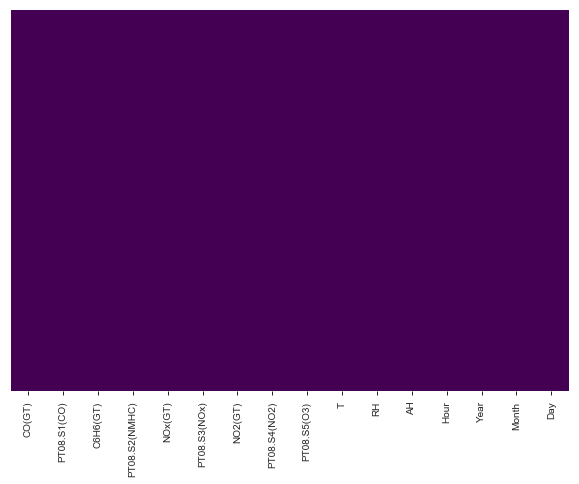

In [77]:
#to find the missing values in the dataset
plt.figure(figsize=(10,7))
sns.heatmap(df_num.isnull(),cmap="viridis",cbar=False,yticklabels=False)

No missing value in the dataset

In [78]:
df_num.describe(include='all')

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Hour,Year,Month,Day
count,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000
mean,2.087329,1099.833166,10.083105,939.153376,235.651393,835.493605,108.166775,1456.264598,1022.906128,18.319809,49.234201,1.025530,11.479591,2004.234568,6.327772,15.941386
std,1.378213,217.080037,7.449820,266.831429,196.904651,256.817320,45.549807,346.206794,398.484288,8.830004,17.316892,0.403813,6.913320,0.423752,3.407854,8.839013
min,0.100000,647.000000,0.100000,383.000000,2.000000,322.000000,2.000000,551.000000,221.000000,-1.900000,9.200000,0.184700,0.000000,2004.000000,1.000000,1.000000
25%,1.043505,937.000000,4.400000,734.500000,100.000000,658.000000,73.000000,1227.000000,731.500000,11.800000,35.800000,0.736800,5.000000,2004.000000,3.000000,8.000000
50%,1.800000,1063.000000,8.200000,909.000000,171.000000,806.000000,104.000000,1463.000000,963.000000,17.800000,49.600000,0.995400,11.000000,2004.000000,6.000000,16.000000
75%,2.800000,1231.000000,14.000000,1116.000000,319.000000,969.500000,134.000000,1674.000000,1273.500000,24.400000,62.500000,1.313700,17.000000,2004.000000,9.000000,24.000000
max,11.900000,2040.000000,63.700000,2214.000000,1479.000000,2683.000000,333.000000,2775.000000,2523.000000,44.600000,88.700000,2.231000,23.000000,2005.000000,12.000000,31.000000


In [79]:
df_num.head()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Hour,Year,Month,Day
0,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578,18,2004,3,10
1,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255,19,2004,3,10
2,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502,20,2004,3,10
3,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867,21,2004,3,10
4,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888,22,2004,3,10


In [80]:
#df_num.hist(bins = 20, figsize=(14,12))

In [81]:
#import seaborn as sns

<Figure size 1008x432 with 0 Axes>

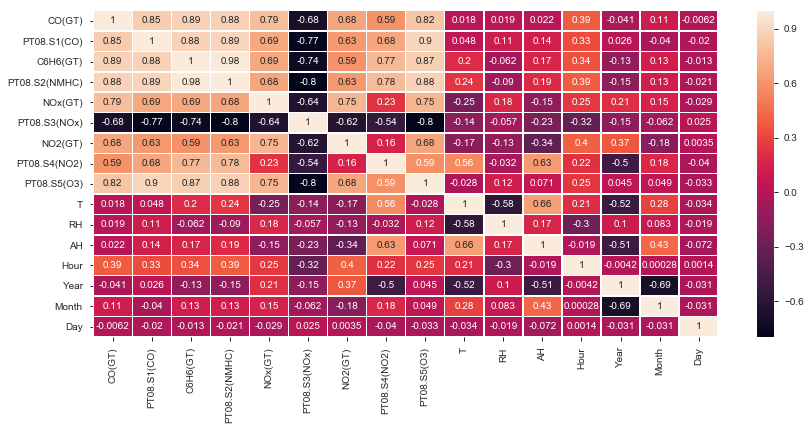

In [82]:
plt.figure(figsize=(14,6))
sns.heatmap(df_num.corr(), annot=True, linewidths=.5,)
plt.show()

## Observation: The heat map illustrates that RH is dependent on few column values that could be considered for linear regression.

In [83]:
sample = df_air_O[['CO(GT)','PT08.S1(CO)','NOx(GT)','PT08.S2(NMHC)','PT08.S3(NOx)','PT08.S5(O3)','RH','AH','T']]

<Figure size 1008x432 with 0 Axes>

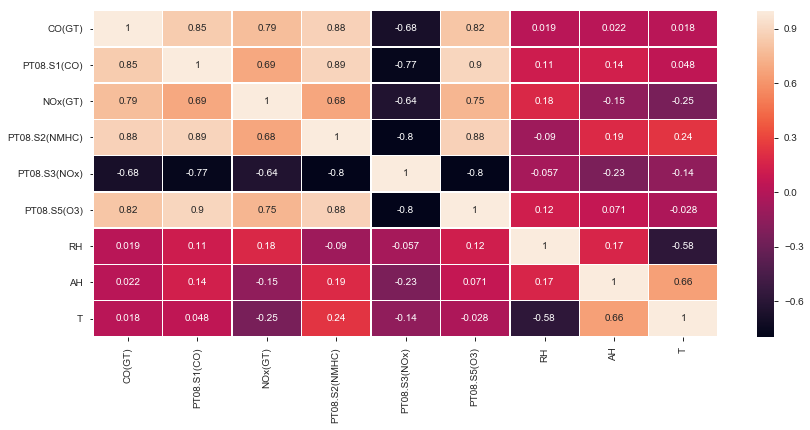

In [84]:
plt.figure(figsize=(14,6))
sns.heatmap(sample.corr(), annot=True, linewidths=.5,)
plt.show()

#### Observation: The heat map illustrates that RH is positively correlated with CO(GT), PT08.S1(CO),NOx(GT),PT08.S5(O3),AH and negative correlated with T


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000012385EED4E0>,
      dtype=object)

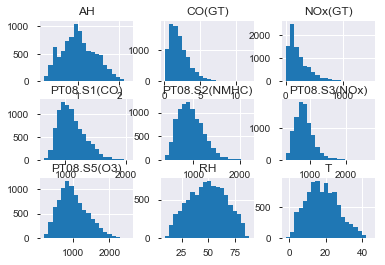

In [85]:
sample.hist(bins = 20)

<Figure size 864x288 with 0 Axes>

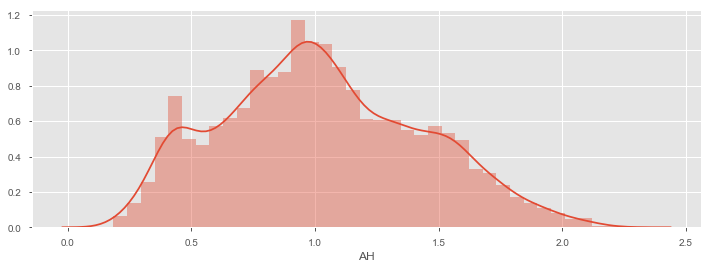

In [86]:
from matplotlib import style
style.use('ggplot')
plt.figure(figsize=(12,4))                                 # Setting the figure size
sns.distplot(df_num['AH'])                     # Creating the histogram
plt.show()

<Figure size 864x288 with 0 Axes>

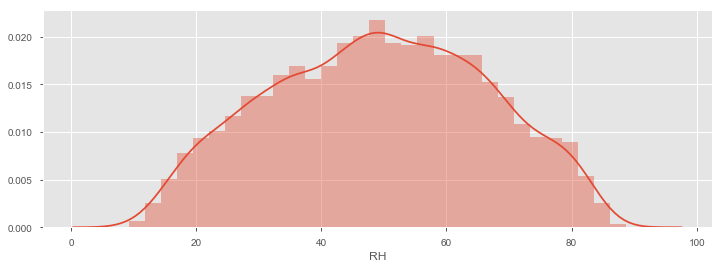

In [87]:
from matplotlib import style
style.use('ggplot')
plt.figure(figsize=(12,4))                                 # Setting the figure size
sns.distplot(df_num['RH'])   

<Figure size 864x288 with 0 Axes>

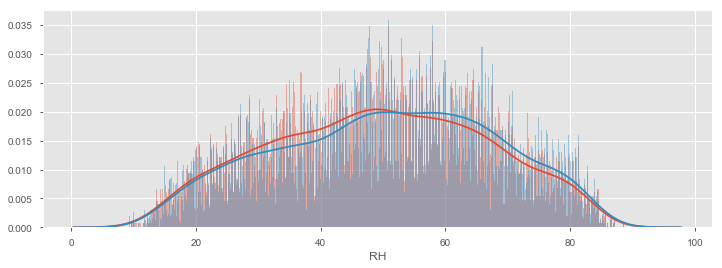

In [88]:
style.use('ggplot')
plt.figure(figsize=(12,4))
sns.set_color_codes("pastel")                                                              
sns.distplot(df_num['RH'],kde=True,bins=480)                                    
sns.distplot(df_num.loc[df_num['AH'] >= 0.5, 'RH'],kde=True,bins=480)   

Text(0.5, 0, 'RH')

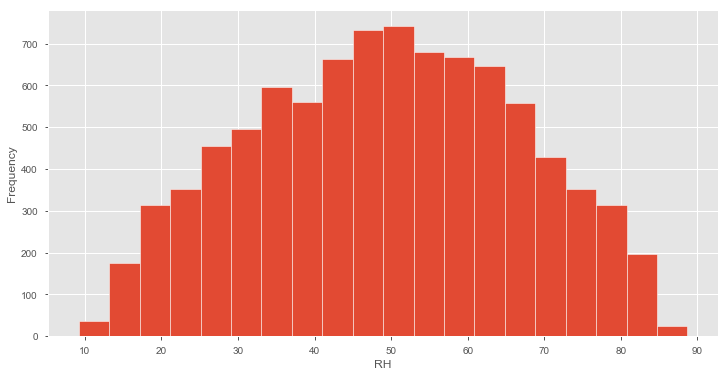

In [89]:
df_num['RH'].plot.hist(bins=20, figsize=(12, 6), edgecolor = 'white')
plt.xlabel('RH', fontsize=12)
#plt.title('RH', fontsize=12)
plt.show()

In [90]:
df_air_O["Timestamp"]=pd.to_datetime(df_air_O["Date"].astype(str) + ' ' + df_air_O["Time"].astype(str))
#df_air_O["Timestamp"]

In [91]:
df_num.shape

(8991, 16)

RH is numerical variable and it ranges between 1 to 100% , we use various regressive models to predict RH.

### 5. Linear Regression

##### STEP 1- CREATE FEATURES AND LABEL

In [92]:
y = df_num['RH']   

In [93]:
x = df_num.drop(['RH'], axis = 1)

In [94]:
x.head()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,AH,Hour,Year,Month,Day
0,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,0.7578,18,2004,3,10
1,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,0.7255,19,2004,3,10
2,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,0.7502,20,2004,3,10
3,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,0.7867,21,2004,3,10
4,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,0.7888,22,2004,3,10


In [95]:
y.head()

0    48.9
1    47.7
2    54.0
3    60.0
4    59.6
Name: RH, dtype: float64

In [96]:
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.linear_model import LinearRegression

In [97]:
x = x.drop(['Hour','Month','Day','Year'], axis = 1, inplace=False)                          

In [98]:
#Features - x, Label - y
x.shape
y.shape

(8991, 11)

(8991,)

###### STEP 2- SPLIT TRAIN AND TEST DATA

In [99]:
# Split in Train and Test data
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=999)
x_train.shape
y_train.shape
x_test.shape
y_test.shape

(6743, 11)

(6743,)

(2248, 11)

(2248,)

In [100]:
print("X_trian shape --> {}".format(x_train.shape))
print("y_train shape --> {}".format(y_train.shape))
print("X_test shape --> {}".format(x_test.shape))
print("y_test shape --> {}".format(y_test.shape))

X_trian shape --> (6743, 11)
y_train shape --> (6743,)
X_test shape --> (2248, 11)
y_test shape --> (2248,)


###### STEP 3- CREATE INSTANCE OF THE MODEL

In [101]:
lm = LinearRegression()

##### STEP 4- FIT MODEL

In [102]:
lm_fit = lm.fit(x_train, y_train)

In [103]:
lm_train_fit = lm_fit.predict(x_train)
lm_train_fit.shape
print('RMSE on train data:', np.sqrt(metrics.mean_squared_error(y_train, lm_train_fit)))

(6743,)

RMSE on train data: 5.983096266960046


##### STEP 5- PREDICT TEST USING THE TRAINED MODEL

In [104]:
y_pred_lm = lm_fit.predict(x_test)
y_pred_lm.shape


(2248,)

In [105]:
from sklearn.metrics import r2_score
print("r2 score on Test:", r2_score(y_test,y_pred_lm))

r2 score on Test: 0.873662285585558


In [106]:
lm.score(x_test, y_test)

0.873662285585558

##### STEP 6- EVALUATE MODEL PERFORMANCE

In [107]:
from sklearn import metrics
print('MAE using Linear Reg:', metrics.mean_absolute_error(y_test, y_pred_lm))
print('MSE using Linear Reg:', metrics.mean_squared_error(y_test, y_pred_lm))
print('RMSE using Linear Reg:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_lm)))
#print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, predicted)))

MAE using Linear Reg: 4.745679798055002
MSE using Linear Reg: 36.89888915226249
RMSE using Linear Reg: 6.074445583941179


In [108]:
lm.coef_

array([-7.83958202e-01,  9.70615685e-03, -8.52801511e-01,  1.39907981e-03,
        1.99708023e-02, -1.24148316e-03, -4.10055626e-02,  1.71307415e-02,
       -1.56808652e-03, -2.30296720e+00,  3.25343211e+01])

In [109]:
coeff_df = pd.DataFrame(lm.coef_, x.columns, columns=['Coefficient'])
coeff_df

,Coefficient
CO(GT),-0.783958
PT08.S1(CO),0.009706
C6H6(GT),-0.852802
PT08.S2(NMHC),0.001399
NOx(GT),0.019971
PT08.S3(NOx),-0.001241
NO2(GT),-0.041006
PT08.S4(NO2),0.017131
PT08.S5(O3),-0.001568
T,-2.302967


In [110]:
df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred_lm, 'difference': y_test - y_pred_lm})
df.head()

,Actual,Predicted,difference
5109,42.3,49.870244,-7.570244
8817,51.8,50.895431,0.904569
6435,75.2,70.579298,4.620702
5491,59.4,61.192267,-1.792267
2591,26.4,28.135693,-1.735693


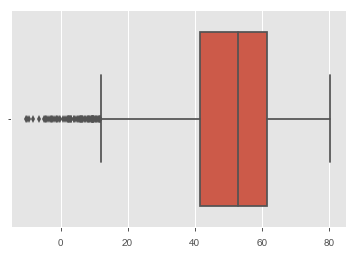

In [111]:
sns.boxplot(y_pred_lm)

In [112]:
lm.intercept_

33.776835492382574

In [113]:
x.columns

Index(['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
       'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'AH'],
      dtype='object')

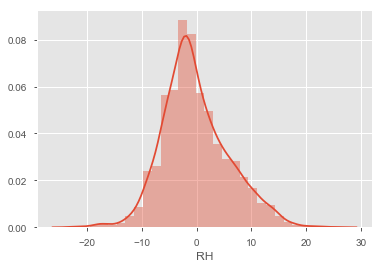

In [114]:
sns.distplot((y_test-y_pred_lm),bins=30);
plt.show()

In [115]:
corr_df = df_num.drop(['Hour','Month','Day','Year'], axis = 1, inplace=False)  

In [116]:
corr_df.corr()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
CO(GT),1.000000,0.846424,0.887255,0.876116,0.787594,-0.683901,0.682348,0.593145,0.818466,0.018062,0.019451,0.021551
PT08.S1(CO),0.846424,1.000000,0.883795,0.892964,0.685642,-0.771938,0.627407,0.682881,0.899324,0.048293,0.114606,0.135324
C6H6(GT),0.887255,0.883795,1.000000,0.981950,0.689588,-0.735744,0.594614,0.765731,0.865689,0.198745,-0.061681,0.167972
PT08.S2(NMHC),0.876116,0.892964,0.981950,1.000000,0.677771,-0.796703,0.626667,0.777254,0.880578,0.241099,-0.090380,0.186933
NOx(GT),0.787594,0.685642,0.689588,0.677771,1.000000,-0.636588,0.754127,0.228180,0.752992,-0.245109,0.181610,-0.145687
PT08.S3(NOx),-0.683901,-0.771938,-0.735744,-0.796703,-0.636588,1.000000,-0.623485,-0.538468,-0.796569,-0.144783,-0.056740,-0.232017
NO2(GT),0.682348,0.627407,0.594614,0.626667,0.754127,-0.623485,1.000000,0.156424,0.681364,-0.170364,-0.125677,-0.341292
PT08.S4(NO2),0.593145,0.682881,0.765731,0.777254,0.228180,-0.538468,0.156424,1.000000,0.591144,0.560850,-0.032188,0.629641
PT08.S5(O3),0.818466,0.899324,0.865689,0.880578,0.752992,-0.796569,0.681364,0.591144,1.000000,-0.027526,0.124956,0.070751
T,0.018062,0.048293,0.198745,0.241099,-0.245109,-0.144783,-0.170364,0.560850,-0.027526,1.000000,-0.579012,0.656087


In [117]:
plt.figure(figsize=(10,7))

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

In [118]:
fig_importance_lm = pd.Series(lm.coef_, index= x.columns)

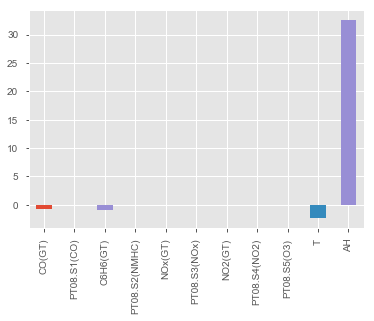

In [119]:
fig_importance_lm.plot(kind = 'bar')
plt.show()

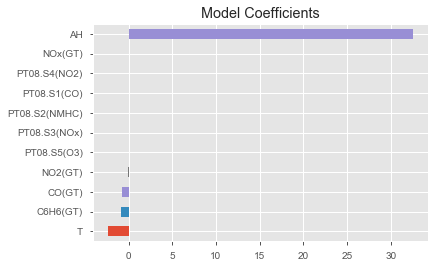

In [120]:
predictors = x_test.columns
from pandas import Series
coef = Series(lm.coef_,predictors).sort_values()
coef.plot(kind='barh', title='Model Coefficients')
#plt.hlines(y=0, xmin= -10, xmax=50)

In [121]:
#skewness and kurtosis
print("Skewness: %f" % df_num['RH'].skew())
print("Kurtosis: %f" % df_num['RH'].kurt())

Skewness: -0.037928
Kurtosis: -0.818375


RH distribution is approximately symmetric based on Skewness score
Kurtosis measures the tail-heaviness of the distribution.The kurtosis of this dataset is -0.82  Since this value is less than 0, it is considered to be a “light-tailed” dataset

In [122]:
#x_test

In [123]:
configure_plotly_browser_state()
px.box(df_num, x="AH",  color="RH",hover_data=['T','PT08.S1(CO)', 'PT08.S5(O3)','C6H6(GT)','PT08.S4(NO2)', 'PT08.S2(NMHC)'],notched=True)

## LIME

In [124]:
# Import lime package
import lime
import lime.lime_tabular

#Find categorical features
categorical_features = np.argwhere(np.array([len(set(x_test.values[:,x])) for x in range(x_test.values.shape[1])]) <= 10).flatten()
#Lime explainer for regression
explainer = lime.lime_tabular.LimeTabularExplainer(x_test.values,feature_names=x_test.columns.values.tolist(),class_names=['RH'],categorical_features=categorical_features,
verbose=True, mode='regression')
ind = 103
#Fit on test data
exp = explainer.explain_instance(x_test.values[ind], lm_fit.predict, num_features=6)
#Show in notebook features influencing predictions
exp.show_in_notebook(show_table=True)

Intercept 43.85147304800421
Prediction_local [63.99403363]
Right: 48.32847601153688


## ELI5

In [125]:
# Import Eli5 package
import eli5
from eli5.sklearn import PermutationImportance

# Find the importance of columns for prediction
perm = PermutationImportance(lm_fit, random_state=1).fit(x_test,y_pred_lm)
eli5.show_weights(perm, feature_names = x_test.columns.tolist())

Weight,Feature
3.1586 ± 0.0794,T
1.3774 ± 0.0423,AH
0.3095 ± 0.0107,C6H6(GT)
0.2798 ± 0.0083,PT08.S4(NO2)
0.1128 ± 0.0026,NOx(GT)
0.0335 ± 0.0003,PT08.S1(CO)
0.0277 ± 0.0009,NO2(GT)
0.0086 ± 0.0003,CO(GT)
0.0030 ± 0.0001,PT08.S5(O3)
0.0011 ± 0.0000,PT08.S2(NMHC)


In [126]:
#Understanding how each feature influences the prediction
eli5.show_prediction(lm_fit, doc=x_test.iloc[[ind]], feature_names=list(x_test.columns))

## SHAP

In [127]:
#Import SHAP package
import shap

#Create explainer for linear model
explainer = shap.LinearExplainer(lm_fit,data=x_test.values)
shap_values = explainer.shap_values(x_test)

C:\Users\Siddhesh\Anaconda3\lib\site-packages\shap\explainers\linear.py:49: UserWarning:

The default value for feature_dependence has been changed to "independent"!



In [128]:
#Understanding how each feature influences the prediction

shap.initjs()
ind = 103


shap.force_plot(
    explainer.expected_value, shap_values[ind,:], x_test.iloc[ind,:],
    feature_names=x_test.columns.tolist()
)

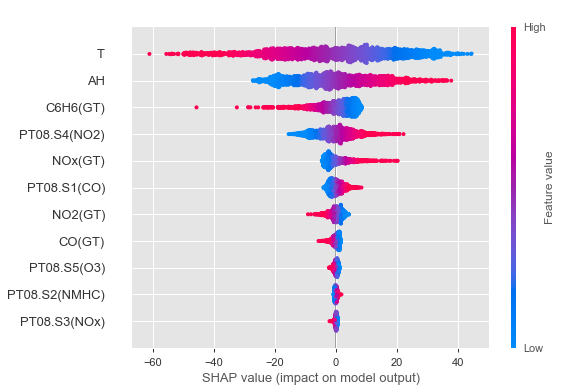

In [129]:
shap.summary_plot(shap_values,x_test)

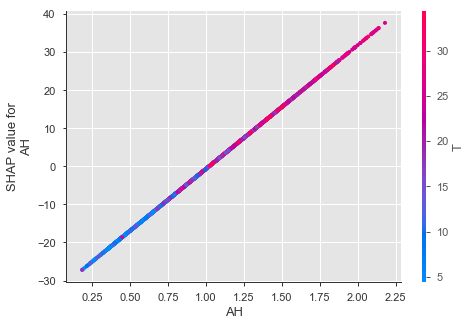

In [130]:
#Most Influential features
shap.dependence_plot("AH", shap_values, x_test)

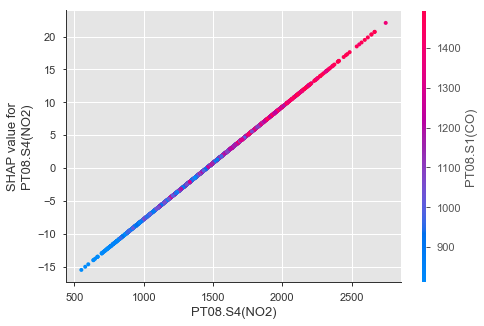

In [131]:
shap.dependence_plot("PT08.S4(NO2)", shap_values, x_test)

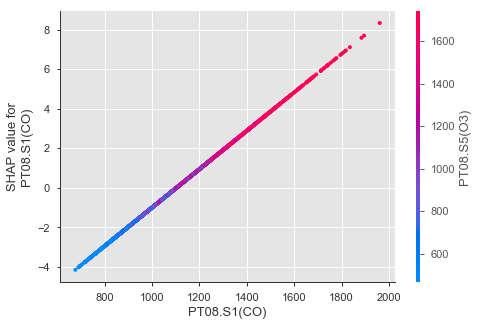

In [132]:
shap.dependence_plot('PT08.S1(CO)', shap_values, x_test)

In [ ]:
data = df_num

In [ ]:
#data

In [ ]:
'''
fig = go.Figure(data=go.Scatter(
    y = np.random.randn(500),
    mode='markers',
    marker=dict(
        size=16,
        color=np.random.randn(500), #set color equal to a variable
        colorscale='Portland', # one of plotly colorscales
        showscale = True
    )
))
fig.update_layout(title='Air Quality')
'''


#### Gradient Boosting Machine and XGBoost

In [134]:
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV

In [143]:
cv_params = {'max_depth': [3,5,7], 'min_child_weight': [1,3,5]}
ind_params = {'learning_rate': 0.1, 
              'n_estimators': 1000,
              'seed':0,
              'subsample': 0.8,
              'colsample_bytree': 0.8, 
             'objective': 'reg:linear'}

In [144]:
optimized_GBM = GridSearchCV(XGBRegressor(**ind_params), 
                            cv_params, cv = 5, n_jobs = -1) 
# Optimize for accuracy since that is the metric used in the Adult Data Set notation

In [164]:
cv_res = optimized_GBM.fit(x_train,y_train)

[23:34:34] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [147]:
optimized_GBM.best_score_

0.9971075279031999

In [168]:
optimized_GBM.cv_results_

{'mean_fit_time': array([ 5.8747766 ,  6.13301663,  5.96155171, 11.31875887, 12.13282537,
        10.25045905, 15.48900075, 16.08151426, 14.84461098]),
 'std_fit_time': array([0.17074666, 0.06812296, 0.07639295, 0.37873181, 0.60749275,
        0.69108324, 0.62328062, 0.96551718, 1.53818052]),
 'mean_score_time': array([0.08436885, 0.08437004, 0.09434395, 0.16911311, 0.16249166,
        0.17498899, 0.32232933, 0.35369411, 0.2917069 ]),
 'std_score_time': array([0.0076554 , 0.00765316, 0.00927558, 0.02879841, 0.03061697,
        0.06202442, 0.06263701, 0.09594406, 0.08664886]),
 'param_max_depth': masked_array(data=[3, 3, 3, 5, 5, 5, 7, 7, 7],
              mask=[False, False, False, False, False, False, False, False,
                    False],
        fill_value='?',
             dtype=object),
 'param_min_child_weight': masked_array(data=[1, 3, 5, 1, 3, 5, 1, 3, 5],
              mask=[False, False, False, False, False, False, False, False,
                    False],
        fill_val

In [170]:
optimized_GBM.best_index_


0

In [200]:
optimized_GBM.param_grid

{'max_depth': [3, 5, 7], 'min_child_weight': [1, 3, 5]}

In [205]:
optimized_GBM.best_params_

{'max_depth': 3, 'min_child_weight': 1}

In [215]:
optimized_GBM.best_index_

0

In [212]:
optimized_GBM.best_index_.itemsize

8

In [210]:
import xgboost
xgdmat = xgboost.DMatrix(x_train, y_train) # Create our DMatrix to make XGBoost more efficient
xgdmat

In [173]:
our_params = {'eta': 0.1, 'seed':0, 'subsample': 0.8, 'colsample_bytree': 0.8, 
             'objective': 'reg:linear', 'max_depth':3, 'min_child_weight':1} 
# Grid Search CV optimized settings


In [174]:
%time cv_xgb = xgboost.cv(params = our_params, dtrain = xgdmat, num_boost_round = 3000, nfold = 5, metrics = ['logloss'], early_stopping_rounds = 100) # Look for early stopping that minimizes error, # Make sure you enter metrics inside a list or you may encounter issues!

[23:47:06] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:47:06] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:47:06] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:47:06] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:47:06] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Wall time: 6.8 s


In [175]:
our_params = {'eta': 0.1, 'seed':0, 'subsample': 0.8, 'colsample_bytree': 0.8, 
             'objective': 'reg:linear', 'max_depth':3, 'min_child_weight':1} 

In [184]:
air_qty_xgb = xgboost.train(our_params, xgdmat, num_boost_round = 500)

[23:52:22] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


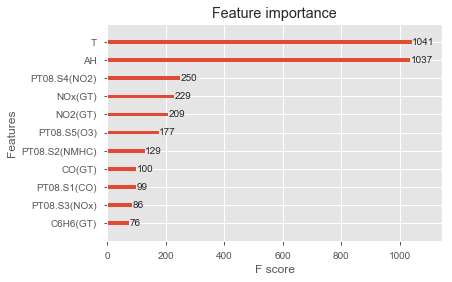

In [185]:
xgboost.plot_importance(air_qty_xgb)

In [186]:
testdmat = xgboost.DMatrix(x_test)

In [194]:
from sklearn import metrics

y_pred_xgb = air_qty_xgb.predict(testdmat) # Predict using our testdmat

air_qty_xgb.best_iteration
air_qty_xgb.booster
air_qty_xgb.get_score
air_qty_xgb.feature_names


print('MAE using xgb:', metrics.mean_absolute_error(y_test, y_pred_xgb))
print('MSE using xgb:', metrics.mean_squared_error(y_test, y_pred_xgb))
print('RMSE using xgb:', np.sqrt(metrics.mean_squared_error(y_test,  y_pred_xgb)))

#print (y_test, y_pred_xgb)

499

'gbtree'

<bound method Booster.get_score of <xgboost.core.Booster object at 0x000001238E7D9860>>

['CO(GT)',
 'PT08.S1(CO)',
 'C6H6(GT)',
 'PT08.S2(NMHC)',
 'NOx(GT)',
 'PT08.S3(NOx)',
 'NO2(GT)',
 'PT08.S4(NO2)',
 'PT08.S5(O3)',
 'T',
 'AH']

MAE using xgb: 0.7801329217347387
MSE using xgb: 1.18112474205439
RMSE using xgb: 1.0867956303070003


### 6. Lasso Regression  <a id='dt'>

In [0]:
from sklearn.linear_model import Lasso

In [0]:
ls = Lasso()

STEP 4- FIT MODEL

In [139]:
ls.fit(x_train, y_train)

Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

STEP 5- PREDICT USING THE TRAINED MODEL

In [140]:
y_predict_ls = ls.predict(x_test)
y_predict_ls.shape

(2248,)

In [141]:
print("Test:", r2_score(y_test,y_predict_ls))

Test: 0.7750498994681221


In [142]:
ls.score(x_train, y_train)

0.7820011122088902

In [143]:
ls.score(x_test, y_test)

0.7750498994681221

STEP 6- EVALUATE MODEL PERFORMANCE

In [144]:
from sklearn import metrics
print('MAE using Lasso:', metrics.mean_absolute_error(y_test, y_predict_ls))
print('MSE using Lasso:', metrics.mean_squared_error(y_test, y_predict_ls))
print('RMSE using Lasso:', np.sqrt(metrics.mean_squared_error(y_test, y_predict_ls)))

MAE using Lasso: 6.2605281967121345
MSE using Lasso: 65.7001661205233
RMSE using Lasso: 8.105563898984654


In [145]:
plt.figure(figsize = (15,10))

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

In [0]:
fig_importance_ls = pd.Series(ls.coef_, index= x.columns)

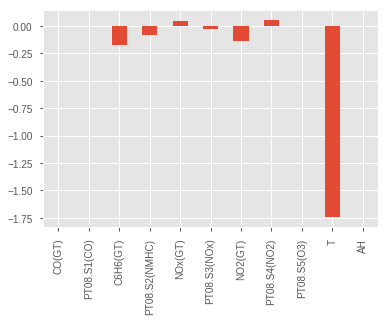

In [147]:
fig_importance_ls.plot(kind = 'bar')
#plt.hlines(y=0, xmin= -0.5, xmax=2.0)

In [0]:
#plt.show()

### 7. Decision Tree  <a id='dt'>

In [149]:
# Filling the missing values with the mean of the columns

from sklearn.preprocessing import Imputer
#Import impute.SimpleImputer from sklearn

imp = Imputer(missing_values='NaN', strategy='mean', axis=0)
X = imp.fit_transform(x)
#X

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:66: DeprecationWarning:

Class Imputer is deprecated; Imputer was deprecated in version 0.20 and will be removed in 0.22. Import impute.SimpleImputer from sklearn instead.



In [150]:
# Importing the packages for Decision Tree Regressor
from sklearn.tree import DecisionTreeRegressor
my_tree_Air = DecisionTreeRegressor(max_depth=4,
                           min_samples_split=5,
                           max_leaf_nodes=10)
my_tree_Air

DecisionTreeRegressor(criterion='mse', max_depth=4, max_features=None,
                      max_leaf_nodes=10, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=5, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=None, splitter='best')

In [151]:
x.describe(include='all')

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,AH
count,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000
mean,2.087329,1099.833166,10.083105,939.153376,235.651393,835.493605,108.166775,1456.264598,1022.906128,18.319809,1.025530
std,1.378213,217.080037,7.449820,266.831429,196.904651,256.817320,45.549807,346.206794,398.484288,8.830004,0.403813
min,0.100000,647.000000,0.100000,383.000000,2.000000,322.000000,2.000000,551.000000,221.000000,-1.900000,0.184700
25%,1.043505,937.000000,4.400000,734.500000,100.000000,658.000000,73.000000,1227.000000,731.500000,11.800000,0.736800
50%,1.800000,1063.000000,8.200000,909.000000,171.000000,806.000000,104.000000,1463.000000,963.000000,17.800000,0.995400
75%,2.800000,1231.000000,14.000000,1116.000000,319.000000,969.500000,134.000000,1674.000000,1273.500000,24.400000,1.313700
max,11.900000,2040.000000,63.700000,2214.000000,1479.000000,2683.000000,333.000000,2775.000000,2523.000000,44.600000,2.231000


In [152]:
y.describe(include='all')

count    8991.000000
mean       49.234201
std        17.316892
min         9.200000
25%        35.800000
50%        49.600000
75%        62.500000
max        88.700000
Name: RH, dtype: float64

In [153]:
x.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8991 entries, 0 to 9356
Data columns (total 11 columns):
CO(GT)           8991 non-null float64
PT08.S1(CO)      8991 non-null float64
C6H6(GT)         8991 non-null float64
PT08.S2(NMHC)    8991 non-null float64
NOx(GT)          8991 non-null float64
PT08.S3(NOx)     8991 non-null float64
NO2(GT)          8991 non-null float64
PT08.S4(NO2)     8991 non-null float64
PT08.S5(O3)      8991 non-null float64
T                8991 non-null float64
AH               8991 non-null float64
dtypes: float64(11)
memory usage: 842.9 KB


### 7.1 Training Decision Tree Model  <a id='tdt'>

In [154]:
# Fit the decision tree model on your features and label
my_tree_Air.fit(x_train, y_train)

DecisionTreeRegressor(criterion='mse', max_depth=4, max_features=None,
                      max_leaf_nodes=10, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=5, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=None, splitter='best')

<Figure size 1080x720 with 0 Axes>

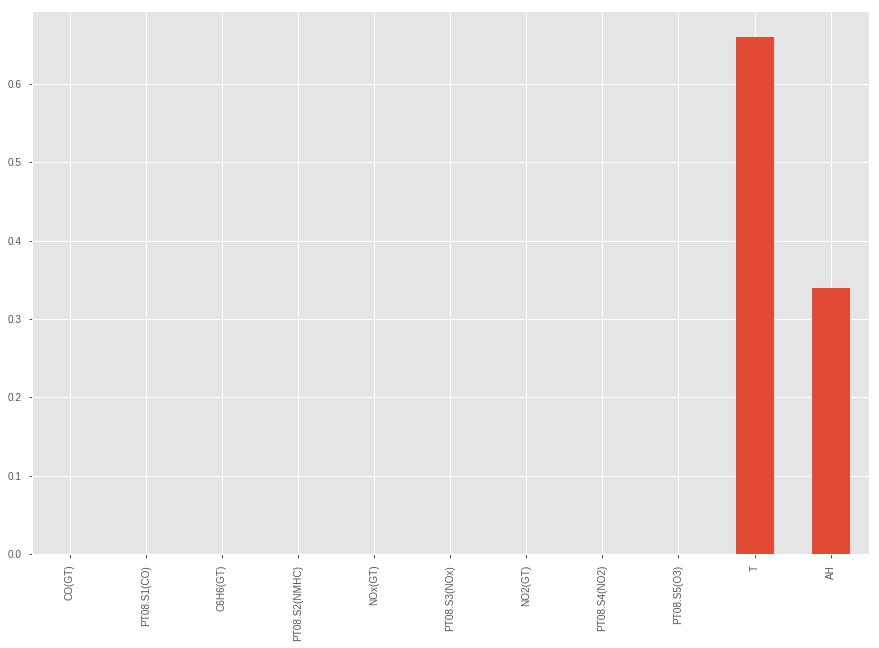

In [155]:
plt.figure(figsize=(15,10))
fig_importance_dt = pd.Series(my_tree_Air.feature_importances_, index= x.columns)
fig_importance_dt.plot(kind = 'bar')
plt.show()

In [156]:
# The feature_importances_ attribute make it simple to interpret the significance of the predictors you include
list(zip(my_tree_Air.feature_importances_))

[(0.0,),
 (0.0,),
 (0.0,),
 (0.0,),
 (0.0,),
 (0.0,),
 (0.0,),
 (0.0,),
 (0.0,),
 (0.6601597288186427,),
 (0.3398402711813573,)]

In [157]:
# The score of the model
print(my_tree_Air.score(x_train, y_train))

0.7391019567754789


In [0]:
#my_tree_Air.feature_importances_

In [159]:
print(my_tree_Air.score(x_test, y_test))

0.7299908138737535


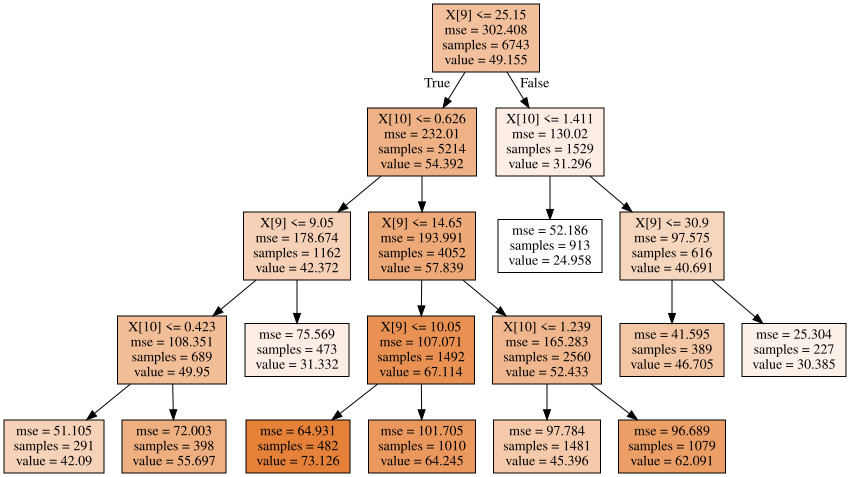

In [160]:
# Visualize the decision tree graph
from sklearn import tree
import graphviz

with open('tree_data_air.dot','w') as x:
    x = tree.export_graphviz(my_tree_Air, out_file=x, filled = True )
 

    
# You may have to install graphviz package using 
# conda install graphviz
# conda install python-graphviz
from graphviz import Source

with open('tree_data_air.dot','r') as f:
    text=f.read()
    plot=Source(text)
plot   

### 7.2 Predictions from Decision Tree Model   <a id='pdt'>

In [161]:
#This is the test dataset where we are going to predict 
x_test.head()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,AH
5109,2.600000,1378.0,15.9,1177.0,238.0,548.0,92.0,1775.0,1266.0,29.6,1.7248
8817,0.882353,940.0,2.0,583.0,93.0,942.0,69.0,991.0,416.0,12.7,0.7574
6435,6.200000,1421.0,20.9,1320.0,739.0,496.0,134.0,1804.0,1556.0,14.6,1.2405
5491,4.000000,1438.0,24.8,1425.0,558.0,451.0,126.0,1971.0,1732.0,21.4,1.4928
2591,1.300000,1010.0,6.1,816.0,80.0,955.0,73.0,1567.0,741.0,34.0,1.3781


In [162]:
# Predictions from Decision Tree Model
y_pred_dt1 = my_tree_Air.predict(x_test)
y_pred_dt1

array([46.70488432, 64.24524752, 64.24524752, ..., 24.95761227,
       64.24524752, 42.09003436])

In [163]:
print('RMSE of DT model:',np.sqrt(metrics.mean_squared_error(y_test,y_pred_dt1)))
print('MAE of DT model:', metrics.mean_absolute_error(y_test, y_pred_dt1))
print('MSE of DT model:', metrics.mean_squared_error(y_test, y_pred_dt1))

RMSE of DT model: 8.880336198122752
MAE of DT model: 7.249909459130265
MSE of DT model: 78.86037099168925


### 7.3 Evaluating the Decision Tree Model  <a id='edt'>

In [0]:
#from sklearn import metrics

#pred = my_tree_Air.predict(x_test)
#df_confusion = metrics.confusion_matrix(y, pred)
#df_confusion
#pred

 7. CV on DecisionTree  <a id = 'appendix'>

** Grid Search **

Grid-searching is the process of scanning the data to configure optimal parameters for a given model.  <br>
Let's apply Grid Search on a Decision Tree Model. It has many parameters like tree depth, criterion... etc. We will build different models with different combinations of these parameters and come up with the best model. 


### 7.4 Parameter Tuning   <a id='ptdt'>

In [0]:
import sklearn
from sklearn.model_selection import learning_curve, GridSearchCV
#param_grid = {'max_depth': np.arange(5, 10)}

param_grid = {"criterion": ["mse", "mae"],
              "min_samples_split": [10, 20, 40],
              "max_depth": [2, 6, 8],
              "min_samples_leaf": [20, 40, 100],
              "max_leaf_nodes": [5, 20, 100],
              }

In [0]:
#my_tree_AirQ = GridSearchCV(DecisionTreeRegressor(), param_grid)
grid_cv_dtm = GridSearchCV(my_tree_Air, param_grid, cv=5)

In [167]:
#CAution : Will take time
grid_cv_dtm.fit(x_train,y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeRegressor(criterion='mse', max_depth=4,
                                             max_features=None,
                                             max_leaf_nodes=10,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=5,
                                             min_weight_fraction_leaf=0.0,
                                             presort=False, random_state=None,
                                             splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ['mse', 'mae'], 'max_depth': [2, 6, 8],
                         'max_leaf_nodes': [5, 20, 100],
                         'min_samples_leaf': [20, 40, 100],
                      

In [168]:
#grid_cv_dtm = grid_cv_dtm.fit(x_train, y_train)

#Print the score of both the decision tree

print("DT with GridSerachCV Score: ",grid_cv_dtm.score(x_train, y_train))
print("Original Decision Tree Score",my_tree_Air.score(x_train,y_train))

DT with GridSerachCV Score:  0.9740443579753455
Original Decision Tree Score 0.7391019567754789


In [169]:
dt_df = pd.DataFrame(data=grid_cv_dtm.cv_results_)
dt_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_max_leaf_nodes,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.013760,0.003205,0.002008,0.000894,mse,2,5,20,10,"{'criterion': 'mse', 'max_depth': 2, 'max_leaf...",0.438437,0.47522,0.45172,0.469417,0.451863,0.45733,0.013301,109
1,0.011044,0.000212,0.001526,0.000027,mse,2,5,20,20,"{'criterion': 'mse', 'max_depth': 2, 'max_leaf...",0.438437,0.47522,0.45172,0.469417,0.451863,0.45733,0.013301,109
2,0.011912,0.001303,0.001847,0.000500,mse,2,5,20,40,"{'criterion': 'mse', 'max_depth': 2, 'max_leaf...",0.438437,0.47522,0.45172,0.469417,0.451863,0.45733,0.013301,109
3,0.010805,0.000215,0.001583,0.000097,mse,2,5,40,10,"{'criterion': 'mse', 'max_depth': 2, 'max_leaf...",0.438437,0.47522,0.45172,0.469417,0.451863,0.45733,0.013301,120
4,0.010862,0.000150,0.001542,0.000029,mse,2,5,40,20,"{'criterion': 'mse', 'max_depth': 2, 'max_leaf...",0.438437,0.47522,0.45172,0.469417,0.451863,0.45733,0.013301,120


We have improved our model score from 0.76 using DT model to 0.97 by fine tuning the parameters of DT with gridsearch cross fold 5. This is called hyperparameters tuning.

In [170]:
# Making predictions on our Train Data 
y_pred_dt_cv = grid_cv_dtm.predict(x_test)
print (y_pred_dt_cv)
print (y_test.values)

[47.19125    46.18148148 80.09885057 ... 20.04752475 59.55308642
 37.18913043]
[42.3 51.8 75.2 ... 22.8 57.  34.5]


In [171]:
r2_score(y_test, y_pred_dt_cv)

0.9665351037095736

In [172]:
print('RMSE of DT with GridSearchCV model:',np.sqrt(metrics.mean_squared_error(y_test,y_pred_dt_cv)))
print('MAE of DT with GridSearchCV model:', metrics.mean_absolute_error(y_test, y_pred_dt_cv))
print('MSE of DT with GridSearchCV model:', metrics.mean_squared_error(y_test, y_pred_dt_cv))

RMSE of DT with GridSearchCV model: 3.1263304438957156
MAE of DT with GridSearchCV model: 2.4972245357549343
MSE of DT with GridSearchCV model: 9.773942044429182


In [173]:
grid_cv_dtm.best_score_

0.9659219898669045

In [174]:
grid_cv_dtm.best_params_

{'criterion': 'mse',
 'max_depth': 8,
 'max_leaf_nodes': 100,
 'min_samples_leaf': 20,
 'min_samples_split': 10}

In [175]:
grid_cv_dtm.best_index_

72

### 8. Random Forest  <a id='rf'>

In [0]:
# Building and fitting Random Forest
from sklearn.metrics import r2_score

from sklearn.ensemble import RandomForestRegressor

forest = RandomForestRegressor(max_depth = 10, n_estimators = 1000, random_state = 1)

### 8.1 Training Random Forest Model  <a id='trf'>

In [0]:
# Fitting the model on Train Data

my_forest_Air = forest.fit(x_train, y_train)

In [178]:
# Print the score of the fitted random forest

print(my_forest_Air.score(x_train, y_train))

0.9991429483812689


 ### 8.2 Predictions from Random Forest Model   <a id='prf'>

In [0]:
# Making predictions
y_pred_rf = my_forest_Air.predict(x_test)

In [180]:
list(zip(x_train.columns,my_forest_Air.feature_importances_))

[('CO(GT)', 9.915819598694406e-05),
 ('PT08.S1(CO)', 9.298268028078595e-05),
 ('C6H6(GT)', 6.658319846401428e-05),
 ('PT08.S2(NMHC)', 7.704229086862976e-05),
 ('NOx(GT)', 0.00010949155928732567),
 ('PT08.S3(NOx)', 0.00013119441589689063),
 ('NO2(GT)', 0.00011807984756611676),
 ('PT08.S4(NO2)', 0.00015323998303171018),
 ('PT08.S5(O3)', 0.00016973579319467388),
 ('T', 0.6116725971870988),
 ('AH', 0.387309894848324)]

In [181]:
my_forest_Air.base_estimator_

DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=None, splitter='best')

In [182]:
my_forest_Air.score(x_test,y_test)

0.997766908958613

In [183]:
from sklearn import metrics
#Calculate RMSE of RF
print('RMSE of RF model:',np.sqrt(metrics.mean_squared_error(y_test,y_pred_rf)))
print('MAE of RF model:', metrics.mean_absolute_error(y_test, y_pred_rf))
print('MSE of RF model:', metrics.mean_squared_error(y_test, y_pred_rf))

RMSE of RF model: 0.8075945001668189
MAE of RF model: 0.5277105070441501
MSE of RF model: 0.6522088766996941


In [184]:
configure_plotly_browser_state()
px.box(df_num, x="AH",  color="RH",hover_data=['T','CO(GT)', 'NO2(GT)','C6H6(GT)','PT08.S4(NO2)'],notched=True)

In [185]:
# Import lime package
import lime
import lime.lime_tabular

#Find categorical features
#categorical_features = np.argwhere(np.array([len(set(x_test.values[:,x])) for x in range(x_test.values.shape[1])]) <= 10).flatten()
#Lime explainer for regression
explainer = lime.lime_tabular.LimeTabularExplainer(x_test.values,feature_names=x_test.columns.values.tolist(),class_names=['RH'],
verbose=True, mode='regression')
ind = 10
#Fit on test data
exp = explainer.explain_instance(x_test.values[ind], my_forest_Air.predict, num_features=8)
#Show in notebook features influencing predictions
exp.show_in_notebook(show_table=True)

Intercept 48.36845864477284
Prediction_local [54.55843053]
Right: 47.096617007819695


##### The output of LIME is a list of explanations, reflecting the contribution of each feature to the prediction of a data sample. This provides local interpretability, and it also allows to determine which feature changes will have most impact on the prediction.

In [186]:
# Import Eli5 package
import eli5
from eli5.sklearn import PermutationImportance

# Find the importance of columns for prediction
perm = PermutationImportance(my_forest_Air, random_state=1).fit(x_test,y_pred_rf)
eli5.show_weights(perm, feature_names = x_test.columns.tolist())


Weight,Feature
2.7002 ± 0.0860,T
1.8887 ± 0.0549,AH
0.0001 ± 0.0000,PT08.S5(O3)
0.0000 ± 0.0000,PT08.S4(NO2)
0.0000 ± 0.0000,PT08.S3(NOx)
0.0000 ± 0.0000,NOx(GT)
0.0000 ± 0.0000,NO2(GT)
0.0000 ± 0.0000,CO(GT)
0.0000 ± 0.0000,PT08.S2(NMHC)
0.0000 ± 0.0000,PT08.S1(CO)


In [187]:
#Understanding how each feature influences the prediction
eli5.show_prediction(my_forest_Air, doc=x_test.iloc[[ind]], feature_names=list(x_test.columns))

In [188]:
# Random Forest Caution will take time
rf = sklearn.ensemble.RandomForestRegressor()
rf.fit(x_train, y_train)
explainerRF = shap.TreeExplainer(my_forest_Air)
shap_values_RF_test = explainerRF.shap_values(x_test)
shap_values_RF_train = explainerRF.shap_values(x_train)
df_shap_RF_test = pd.DataFrame(shap_values_RF_test, columns=x_test.columns.values)
df_shap_RF_train = pd.DataFrame(shap_values_RF_train, columns=x_train.columns.values)


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=10,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

In [189]:
shap.initjs()
ind = 103


shap.force_plot(
    explainerRF.expected_value, shap_values_RF_test[ind,:], x_test.iloc[ind,:],
    feature_names=x_test.columns.tolist()
)

In [0]:
#shap.force_plot(explainerRF.expected_value, shap_values_RF_test[j], x_test.iloc[[j]])

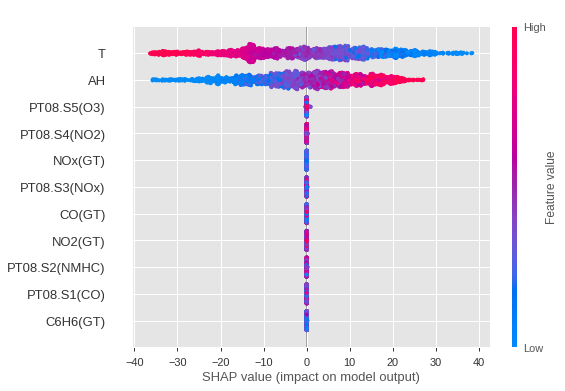

In [191]:
shap.summary_plot(shap_values_RF_test,x_test)

##### Relative Humidity is positively correlated with Absolute Humidity (AH)  and with Temparatue it is negatively correlated

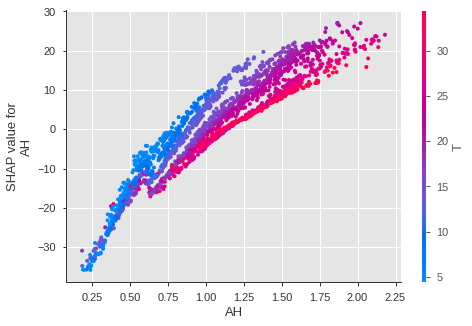

In [192]:
#Most Influential features
shap.dependence_plot("AH", shap_values_RF_test, x_test)

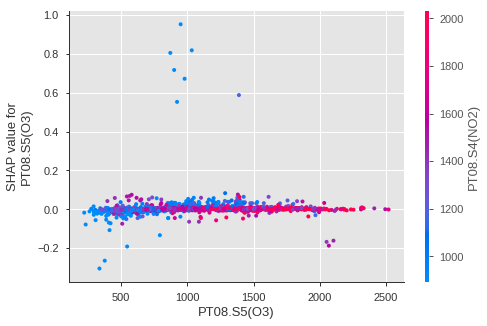

In [193]:
#Most Influential features
shap.dependence_plot("PT08.S5(O3)", shap_values_RF_test, x_test)

**Randomized Search**

Using Randomized Search, we can define a grid of hyperparameters and randomly sample from the grid to get the best combination of values. <br>
Lets apply Randomized search on Random Forest model. This model has plenty of parameters like number of trees, depth of trees...etc. We will evaluate models with different parameters and come up with the best model.

In [0]:
# Different parameters we want to test

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 220, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 50, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

In [0]:
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [0]:
# Importing RandomizedSearchCV
from sklearn.model_selection import RandomizedSearchCV

In [0]:
forest_two = RandomForestRegressor()
# Fitting 3 folds for each of 100 candidates, totalling 300 fits
rf_random = RandomizedSearchCV(estimator = forest_two, param_distributions = random_grid, 
                               n_iter = 5, cv = 3, verbose=2, random_state=42)

In [198]:
#Dont Run, will take too much time
rf_random.fit(x_train,y_train)

Fitting 3 folds for each of 5 candidates, totalling 15 fits
[CV] n_estimators=200, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=26, bootstrap=True 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  n_estimators=200, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=26, bootstrap=True, total=   1.7s
[CV] n_estimators=200, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=26, bootstrap=True 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.7s remaining:    0.0s


[CV]  n_estimators=200, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=26, bootstrap=True, total=   1.7s
[CV] n_estimators=200, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=26, bootstrap=True 
[CV]  n_estimators=200, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=26, bootstrap=True, total=   1.6s
[CV] n_estimators=204, min_samples_split=10, min_samples_leaf=4, max_features=sqrt, max_depth=42, bootstrap=False 
[CV]  n_estimators=204, min_samples_split=10, min_samples_leaf=4, max_features=sqrt, max_depth=42, bootstrap=False, total=   2.5s
[CV] n_estimators=204, min_samples_split=10, min_samples_leaf=4, max_features=sqrt, max_depth=42, bootstrap=False 
[CV]  n_estimators=204, min_samples_split=10, min_samples_leaf=4, max_features=sqrt, max_depth=42, bootstrap=False, total=   2.5s
[CV] n_estimators=204, min_samples_split=10, min_samples_leaf=4, max_features=sqrt, max_depth=42, bootstrap=False 
[CV]  n_estimators=204,

[Parallel(n_jobs=1)]: Done  15 out of  15 | elapsed:  1.1min finished


RandomizedSearchCV(cv=3, error_score='raise-deprecating',
                   estimator=RandomForestRegressor(bootstrap=True,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators='warn',
                                                   n_jobs=None, oob_score=False,
                                                   random_sta...


In [199]:
rf_random.best_params_

{'bootstrap': False,
 'max_depth': 30,
 'max_features': 'auto',
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 204}

In [200]:
rf_random.best_score_

0.9925911236937409

In [201]:
rf_random.best_index_

2

A Random Forest model built with this hyperparameters will provide best accuracy

In [202]:
rf_random.score

<bound method BaseSearchCV.score of RandomizedSearchCV(cv=3, error_score='raise-deprecating',
                   estimator=RandomForestRegressor(bootstrap=True,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators='warn',
                                                   n_jobs=None, oob_score=False,
                             

In [0]:
y_pred_rf_rs = rf_random.predict(x_test)

In [204]:
rf_random.score(x_test,y_test)

0.9947685409274637

In [205]:
print('RMSE of RF with RS model:',np.sqrt(metrics.mean_squared_error(y_test,y_pred_rf_rs)))
print('MAE of RF with RS model:', metrics.mean_absolute_error(y_test, y_pred_rf_rs))
print('MSE of RF with RS model:', metrics.mean_squared_error(y_test, y_pred_rf_rs))

RMSE of RF with RS model: 1.2360941584977077
MAE of RF with RS model: 0.8771646692484881
MSE of RF with RS model: 1.527928768672156


**Observation: ** The original Random forest algorithm gave 0.80 accuracy whereas after Randomized Grid Search we have only got 1.23. This is the best random combination of parameters the algorithm has chosen which produced the lowest RMSE score.

### 9.XG Boost Regressor

ML model building will be incomplete without trying thr XGBoost model.

In [0]:
#from xgboost import XGBRegressor


### 9.SUPPORT VECTOR REGRESSOR

In [0]:
from sklearn.svm import SVR

In [207]:
support_regressor = SVR(kernel='rbf', C=1000)
sv_model = support_regressor.fit(x_train, y_train)
print (sv_model)

SVR(C=1000, cache_size=200, coef0=0.0, degree=3, epsilon=0.1,
    gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
    tol=0.001, verbose=False)


In [0]:
y_pred_sv = sv_model.predict(x_test)         #predict

In [209]:
sv_model.get_params

<bound method BaseEstimator.get_params of SVR(C=1000, cache_size=200, coef0=0.0, degree=3, epsilon=0.1,
    gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
    tol=0.001, verbose=False)>

In [210]:
sv_model.intercept_

array([49.15339883])

In [211]:
sv_model.score(x_train, y_train)

0.9999669987324207

In [212]:
sv_model.score(x_test, y_test)

-0.0003493386476871585

In [213]:
from sklearn import metrics
#Calculate RMSE of SVR
print('RMSE of SVR model:',np.sqrt(metrics.mean_squared_error(y_test,y_pred_sv)))
print('MAE of SVR model:', metrics.mean_absolute_error(y_test, y_pred_sv))
print('MSE of SVR model:', metrics.mean_squared_error(y_test, y_pred_sv))

RMSE of SVR model: 17.092909086338018
MAE of SVR model: 14.162088769961194
MSE of SVR model: 292.1675410338168


### 10.KNN Regressor

In [0]:
from sklearn.neighbors import KNeighborsRegressor

In [215]:
error_rate = []
for i in range(1,20):
    knn = KNeighborsRegressor(n_neighbors=i)
    knn.fit(x_train, y_train)
    pred_i = knn.predict(x_test)
    error_rate.append(np.mean(pred_i != y_test))

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                    weights='uniform')

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=2, p=2,
                    weights='uniform')

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=3, p=2,
                    weights='uniform')

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=4, p=2,
                    weights='uniform')

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                    weights='uniform')

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=6, p=2,
                    weights='uniform')

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=7, p=2,
                    weights='uniform')

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=8, p=2,
                    weights='uniform')

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=9, p=2,
                    weights='uniform')

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=10, p=2,
                    weights='uniform')

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=11, p=2,
                    weights='uniform')

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=12, p=2,
                    weights='uniform')

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=13, p=2,
                    weights='uniform')

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=14, p=2,
                    weights='uniform')

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=15, p=2,
                    weights='uniform')

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=16, p=2,
                    weights='uniform')

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=17, p=2,
                    weights='uniform')

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=18, p=2,
                    weights='uniform')

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=19, p=2,
                    weights='uniform')

<Figure size 720x432 with 0 Axes>

[<matplotlib.lines.Line2D at 0x7fc985a16908>]

Text(0.5, 0, 'k')

Text(0, 0.5, 'Error Rate')

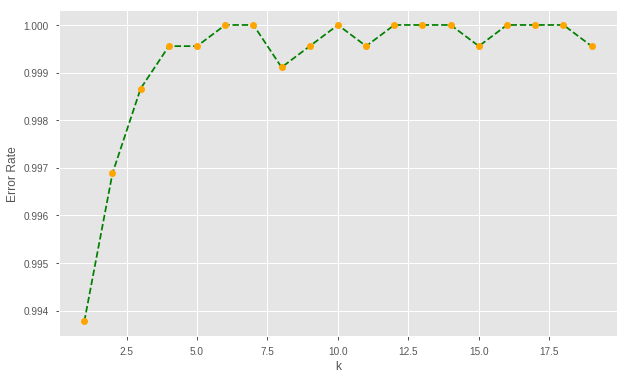

In [216]:
# Plot the error rate for different neighbours

plt.figure(figsize=(10,6))
plt.plot(range(1,20), error_rate, color='green', linestyle='dashed', marker='o', markerfacecolor='orange')
plt.title = 'Error rate vs K Value'
plt.xlabel('k')
plt.ylabel('Error Rate')

In [217]:
knn= KNeighborsRegressor(n_neighbors=1)
knn.fit(x_train, y_train)
y_pred_knn= knn.predict(x_test)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                    weights='uniform')

In [218]:
knn.score(x_train, y_train)

1.0

In [219]:
knn.score(x_test, y_test)

0.5378849317682395

KNN does very good job on training data by scoring 1.0 whereas the test data score is only 0.53

In [220]:
print('RMSE of KNN model:',np.sqrt(metrics.mean_squared_error(y_test,y_pred_knn)))
print('MAE of KNN model:', metrics.mean_absolute_error(y_test, y_pred_knn))
print('MSE of KNN model:', metrics.mean_squared_error(y_test, y_pred_knn))

RMSE of KNN model: 11.617567459045823
MAE of KNN model: 8.227402135231317
MSE of KNN model: 134.96787366548043


In [221]:
'''
explainerKNN = shap.KernelExplainer(knn.predict,x_test.values)
shap_values_KNN_test = explainerKNN.shap_values(x_test)
'''

'\nexplainerKNN = shap.KernelExplainer(knn.predict,x_test.values)\nshap_values_KNN_test = explainerKNN.shap_values(x_test)\n'

In [222]:
# now we can plot the SHAP explainer
'''
shap.initjs()
ind = 103


shap.force_plot(
    explainerKNN.expected_value, shap_values_KNN_test[ind,:], x_test.iloc[ind,:],
    feature_names=x_test.columns.tolist()
)
#j= 49
#shap.force_plot(explainerKNN.expected_value, shap_values_KNN_test[j], x_test.iloc[[j]])


exp = explainer.explain_instance(x_test.values[j], knn.predict, num_features=5)
exp.show_in_notebook(show_table=True)
'''

'\nshap.initjs()\nind = 103\n\n\nshap.force_plot(\n    explainerKNN.expected_value, shap_values_KNN_test[ind,:], x_test.iloc[ind,:],\n    feature_names=x_test.columns.tolist()\n)\n#j= 49\n#shap.force_plot(explainerKNN.expected_value, shap_values_KNN_test[j], x_test.iloc[[j]])\n\n\nexp = explainer.explain_instance(x_test.values[j], knn.predict, num_features=5)\nexp.show_in_notebook(show_table=True)\n'

In [223]:
print('RMSE of each model:')
print('Linear Regression                     :',np.sqrt(metrics.mean_squared_error(y_test,y_pred_lm)))
print('Lasso Regression                      :',np.sqrt(metrics.mean_squared_error(y_test,y_predict_ls)))
print('Decision Tree Regression              :',np.sqrt(metrics.mean_squared_error(y_test,y_pred_dt1)))
print('Decision Tree with GridSearchCV       :',np.sqrt(metrics.mean_squared_error(y_test,y_pred_dt_cv)))
print('Random Forest Regression              :',np.sqrt(metrics.mean_squared_error(y_test,y_pred_rf)))
print('Random Forest with Randomized Search  :',np.sqrt(metrics.mean_squared_error(y_test,y_pred_rf_rs)))
print('Support Vector Regression             :',np.sqrt(metrics.mean_squared_error(y_test,y_pred_sv)))
print('KNN Regression                        :',np.sqrt(metrics.mean_squared_error(y_test,y_pred_knn)))

RMSE of each model:
Linear Regression                     : 6.074445583941177
Lasso Regression                      : 8.105563898984654
Decision Tree Regression              : 8.880336198122752
Decision Tree with GridSearchCV       : 3.1263304438957156
Random Forest Regression              : 0.8075945001668189
Random Forest with Randomized Search  : 1.2360941584977077
Support Vector Regression             : 17.092909086338018
KNN Regression                        : 11.617567459045823


In [224]:
print('Model Score')
print ('Linear Regression                    :',lm.score(x_test, y_test))
print ('Lasso Regression                     :',ls.score(x_test, y_test))
print ('Decision Tree Regression             :', my_tree_Air.score(x_test, y_test))
print ('Random Forest Regression             :',my_forest_Air.score(x_test,y_test))
print ('Decision Tree with GridSearchCV      :',grid_cv_dtm.best_score_)
print ('Random Forest with Randomized Search :',rf_random.best_score_)
print ('Support Vector Regression            :',sv_model.score(x_test, y_test))
print ('KNN Regression                       :',knn.score(x_test, y_test))

Model Score
Linear Regression               : 0.8736622855855581
Lasso Regression                : 0.7750498994681221
Decision Tree Regression        : 0.7299908138737535
Random Forest Regression        : 0.997766908958613
Decision Tree with GridSearchCV : 0.9659219898669045
Random Forest with Randomized Search : 0.9925911236937409
Support Vector Regression       : -0.0003493386476871585
KNN Regression                  : 0.5378849317682395


##### Observation:  The original Linear Regression algorithm gave 6.07 as RMSE value whereas using RandomForest  it gave 0.80. 

##### Also RF model proves to be the best model which gives the score of 0.997 compared to other models

### The End